In [1]:
# data manipulation
import pandas as pd
import numpy as np
import time
import re
from tqdm import tqdm

# text preprocessing
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.downloader.download('vader_lexicon')

# visualizing
import matplotlib.pyplot as plt
import altair as alt
import seaborn as sns
sns.set_style('darkgrid')

# clusters
from sklearn import metrics
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.datasets import fetch_20newsgroups
# PCA Decomposition
from sklearn.decomposition import PCA
# silhouette method
from sklearn.metrics import silhouette_samples, silhouette_score

# annoying error messages =P
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Daniel\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


# Data Gathering

In [35]:
# https://scikit-learn.org/0.19/datasets/twenty_newsgroups.html
newsgroups_train = fetch_20newsgroups(subset='train')

#show topics
print(list(newsgroups_train.target_names))

['alt.atheism', 'comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x', 'misc.forsale', 'rec.autos', 'rec.motorcycles', 'rec.sport.baseball', 'rec.sport.hockey', 'sci.crypt', 'sci.electronics', 'sci.med', 'sci.space', 'soc.religion.christian', 'talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc', 'talk.religion.misc']


In [36]:
categories = [
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'rec.sport.baseball',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'rec.sport.hockey',
 'alt.atheism',
 'soc.religion.christian',
]
dataset = fetch_20newsgroups(subset='train', categories=categories, shuffle=True, remove=('headers', 'footers', 'quotes'))

In [37]:
df1 = pd.DataFrame(dataset['data'], columns = ['content'])
df1

,content
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ..."
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo..."
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri..."
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...
...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un..."
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...


---
# Data Preprocessing
- First, convert text to sentences.
- Convert sentences to words.
- Perform text cleaning.(stemming, lemmatization, remove stopwords)
    - stemming.
    - lemmatization.
    - remove stopwords.
    - remove punctuations.
    - lower cases.
- Vectorization

### Lemmatizing and removing stopwords

In [5]:
news = df1.copy()

In [6]:
import string

def text_process(text):
    stemmer = WordNetLemmatizer()
    # remove punctuation
    nopunc = [char for char in text if char not in string.punctuation] # '!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'
    # remove digits
    nopunc = ''.join([i for i in nopunc if not i.isdigit()])
    # split each review into words, lowecase them and remove stopwords
    nopunc = [word.lower() for word in nopunc.split() if word not in stopwords.words('english')]
    # lemmatize the list of words created
    return [stemmer.lemmatize(word) for word in nopunc]

In [7]:
t0 = time.time()
news['filtered_content'] = news['content'].apply(text_process).apply(lambda x : " ".join(x))
print(f'Done! Elapsed time: {round(time.time() - t0, 1)} seconds')

Done! Elapsed time: 293.2 seconds


In [8]:
news.shape

(5026, 2)

In [9]:
news.head()

,content,filtered_content
0,\n\nI have discussed this with my girlfriend o...,i discussed girlfriend often i consider marrie...
1,\nYou might want to re-think your attitude abo...,you might want rethink attitude holocaust read...
2,"\nIt's bad jokes like that which draws crohns,...",it bad joke like draw crohn i mean groan crowd...
3,"\n\nIf anyone gets the New York Times, the Edi...",if anyone get new york time edit page transcri...
4,I apologize for the long delay in getting a re...,i apologize long delay getting response posted...


---
# Text vectorizing

- Vectorization is nothing but reating a vector of words called vocabulary.
- Indicates the importance of certain word inside of a text corpus.


## TFIDF
- TFIDF is a product of how frequent a word is in a document multiplied by **how unique a word is**.
- TF stands for **term frequency**.
    - Counts how many times certain word appeared inside of a text corpus.
- IDF **stands for Inverse Document Frequency**.
    - IDF measures the relevance of the word in other text corpus.
    - In a nutshel, IDF will measure how rare a word will be for the entire dataset.
    - Rare words will have higher values than frequent words.
- In a classification model for example, will be interesting to use rare words instead of frequent words.

In [10]:
stop_words = stopwords.words('english')
vectorizer = TfidfVectorizer(
                             min_df = 5, # ignore words that appear in less than 10 documents
                             max_df = 0.95, # ignore words that appear more than 90% of documents
                             max_features = None,
                             analyzer = 'word',
                             stop_words = stop_words)


tfidf_text = vectorizer.fit_transform(news.filtered_content)

print(f'n_samples:{tfidf_text.shape[0]}, num_features: {tfidf_text.shape[1]}')

n_samples:5026, num_features: 8678


- ```max_df``` is used for removing terms that appear too frequently, also known as "corpus-specific stop words".
     -  **max_df = 0.50** means "ignore terms that appear in more than 50% of the documents".
     -  **max_df = 25** means "ignore terms that appear in more than 25 documents".
---
- ```min_df``` is used for removing terms that appear too infrequently.
    - **min_df = 0.01** means "ignore terms that appear in less than 1% of the documents".
    - **min_df = 5** means "ignore terms that appear in less than 5 documents".

In [11]:
vec = tfidf_text

---
# K-means optimization
In the field of trying to find the optimal number o clusters, we have a few solutions.

### Elbow Method

- Elbow methods measures the euclidean distance from the datapoint to its cluster.
- Then we square and sum them all up.
- As the number of clusters increases, each single datapoint will have a cluster center closer to it. Resulting in a decreasing sum of square erros.
- The main point is to find the "elbow" of the graph, which means by increaing the number of clusters more we're getting less and less ideal increase of the sum of squared error, so the elbow point should be the optimal number for cluster. 


### Silhouette Method
- Sometimes it's hard to find a good elbow point on previous elbow graph, so we need to use another strategy to find the optimal number, the Silhouette method.
- Silhouette method measures the distance between each cluster minus the distance within each cluster.
- The higher the value of the silhouette score the better it divides the dataset into differente clusters.


100%|██████████| 9/9 [00:25<00:00,  2.88s/it]


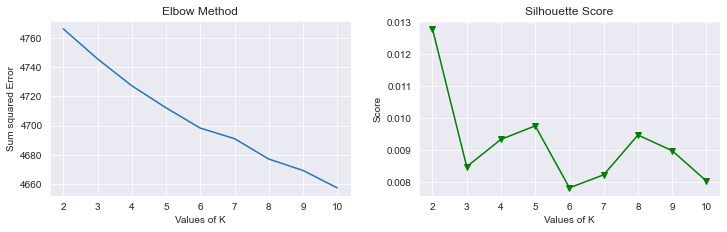

In [12]:
def optimise_kmeans(data, max_k):
    means = []
    inertias = []
    
    silhouette_avg = []
    
    for k in tqdm(range(2, max_k + 1)):
        kmeans = KMeans( n_clusters = k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)
        
        # silhouette
        cluster_labels = kmeans.labels_
        silhouette_avg.append(silhouette_score(data, cluster_labels))
        #labels.append(k)

    
    fig, ax =  plt.subplots(1, 2, figsize = (10,3))
    fig.tight_layout(w_pad = 4)
    
    # Elbow method
    ax[0].plot(means, inertias)
    ax[0].set_title('Elbow Method')
    ax[0].set_xlabel('Values of K')
    #plt.xticks(np.arange(1, k, 1))
    ax[0].set_ylabel('Sum squared Error')
    plt.grid(True)
    
    # Silhouette
    ax[1].plot(means, silhouette_avg , 'bv-', color = 'green')
    ax[1].set_title('Silhouette Score')
    ax[1].set_xlabel('Values of K')
    ax[1].set_ylabel('Score')
    plt.grid(True)

    plt.show()
    
    
optimise_kmeans(vec, 10)

- It appears that the "elbow" point isn't that clear to find, so we can't define a good number of clusters.   
- With the help of silhouette score, we can see the score drastically decreasing from cluster 2 to 3, peaking at cluster 4 and getting chaotic after it, looks like k-means is struggling to find an optimal score from past cluster 4. 
- That said, i will be taking **k = 4**.  

In [66]:
kmeans = KMeans(init = 'random', 
                n_clusters = 4,
                #n_init = 10,
                #random_state = 42
               )
kmeans.fit(vec)

KMeans(init='random', n_clusters=4)

---
# Some insights about the data

In [67]:
news['clusters'] = kmeans.labels_

In [68]:
words = vectorizer.get_feature_names_out()[0:10]
words

array(['aa', 'aaa', 'aaron', 'ab', 'abandon', 'abandoned', 'abbey', 'abc',
       'abiding', 'ability'], dtype=object)

In [69]:
# Greater TFIDF values
review_groups = news.clusters.value_counts()
review_groups

clusters
0    2679
3    1067
2     649
1     631
Name: count, dtype: int64

### Naming the clusters

In [70]:
words = vectorizer.get_feature_names_out()

# 14 most common words from each group
common_words = kmeans.cluster_centers_.argsort()[:,-1:-15:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + " : " + ', '.join(words[word] for word in centroid))

0 : would, one, dont, think, know, get, like, im, people, say, time, post, could, anyone
1 : window, file, driver, program, thanks, card, know, anyone, use, problem, please, graphic, using, version
2 : game, team, player, year, season, play, win, hockey, league, last, fan, good, go, think
3 : god, people, would, one, dont, christian, think, say, jesus, armenian, know, right, israel, believe


### Renaming clusters names

- Cluster 0 seem to be related with sports.
- Cluster 1 seem to contain news about religion.
- Cluster 2 seem related to technology in general.
- Cluster 3 is related to politics.

In [71]:
# Renaming clusters
def cluster_names(cluster):
    if cluster == 0:
        return 'sports'
    elif cluster == 1:
        return "religion"
    elif cluster == 2:
        return 'technology'
    elif cluster == 3:
        return 'politics'
    
news.clusters = news.clusters.apply(cluster_names)

In [72]:
# show random samples of each group
def sample_reviews(data, amount = 1):
    
    print('')
    for i in data.clusters.unique():
        print(f'cluster: {i}\n')
        for j in range(0, amount):
            print(data['content'][data['clusters'] == i].sample(1))
            print('')
        print(f"{'-' * 90}")
        

In [73]:
sample_reviews(news, 1)


cluster: politics

693    (reference line trimmed)\n\n\n\nWell, I'd say that a murderer is one who intentionally committed...
Name: content, dtype: object

------------------------------------------------------------------------------------------
cluster: sports

3714    In <sfnNTrC00WBO43LRUK@andrew.cmu.edu> "David R. Sacco" <dsav+@andrew.cmu.edu> \n\n\nYes.\n\nMAC...
Name: content, dtype: object

------------------------------------------------------------------------------------------
cluster: technology

1197    Today, Frank Viola and rest of pitcher staff of Boston Red Sox shutout Chicago\nWhite Sox 4-0.  ...
Name: content, dtype: object

------------------------------------------------------------------------------------------
cluster: religion

1338    I can't fiqure this out.  I have properly compiled pov on a unix machine\nrunning SunOS 4.1.3  T...
Name: content, dtype: object

------------------------------------------------------------------------------------------


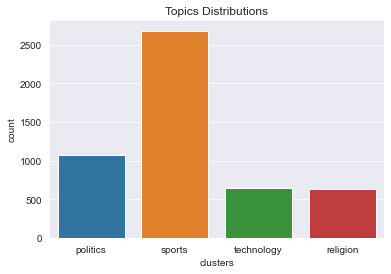

In [74]:
sns.countplot(x = news.clusters)
plt.title('Topics Distributions')
plt.show()

### Number of words

In [22]:
# num words
pd.set_option('max_colwidth', 100)
news['num_words'] = news["filtered_content"].apply(lambda x: x.split()).apply(len)
news.sample(2)

,content,filtered_content,clusters,num_words
4772,\nMight? You'd have to have no sense of humor at all not to! My favorite\nstuff are the Zero Her...,might youd sense humor my favorite stuff zero hero player havent hit homer long time lgtgah name...,religion,39
173,Here is a press release from the Reserve Officers Association.\n\n Reserve Officers Say Demograp...,here press release reserve officer association reserve officer say demographic ignored nominatio...,technology,267


### Number of unique words

In [23]:
# number of unique words
news['num_vocab'] = news['filtered_content'].apply(lambda x: x.split()).apply(set).apply(len)
news.sample(2)

,content,filtered_content,clusters,num_words,num_vocab
1720,"\nHow does that compare with JPEG on the same images and hardware as far\nas size, speed, and im...",how compare jpeg image hardware far size speed image quality concerned despite skeptical sometim...,technology,30,27
2574,,,technology,0,0


### Lexical Diversity

In [24]:
news['lexical_div'] = news['num_words'] / news['num_vocab']
news.sample(2)

,content,filtered_content,clusters,num_words,num_vocab,lexical_div
2652,\n: >: Rate := per capita rate. The UK is more dangerous.\n: >: Though you may be less likely t...,rate per caput rate the uk dangerous though may le likely killed handgun average individual citi...,technology,128,84,1.52381
131,"Me, too... RBI are a worthless stat. Of course, so is stolen bases because \nsometimes runners a...",me rbi worthless stat of course stolen base sometimes runner front player would otherwise run an...,technology,55,43,1.27907


### Average word length

In [25]:
news["num_char"]=news["filtered_content"].str.len()
news['avg_word_length'] = news['num_char'] / news['num_words']
news.sample(2)

,content,filtered_content,clusters,num_words,num_vocab,lexical_div,num_char,avg_word_length
1334,\nThe Cold War has not ended. The only thing that has happened is that \nthe two sides have exc...,the cold war ended the thing happened two side exchanged role the usa higher imprisonment rate p...,technology,201,155,1.296774,1338,6.656716
803,"\n\nRISC used to mean ""Reduced Instruction Set Computer"", true. They\nstill use the same acrony...",risc used mean reduced instruction set computer true they still use acronym familiar what risc r...,technology,65,49,1.326531,454,6.984615


---
# Applying PCA (Principal Component Analysis)

In [26]:
centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

In [27]:
# PCA Decomposition
pca = PCA(n_components = 2, random_state = 42)
pca_vecs = pca.fit_transform(vec.toarray())
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [28]:
news['x0'] = x0
news['x1'] = x1

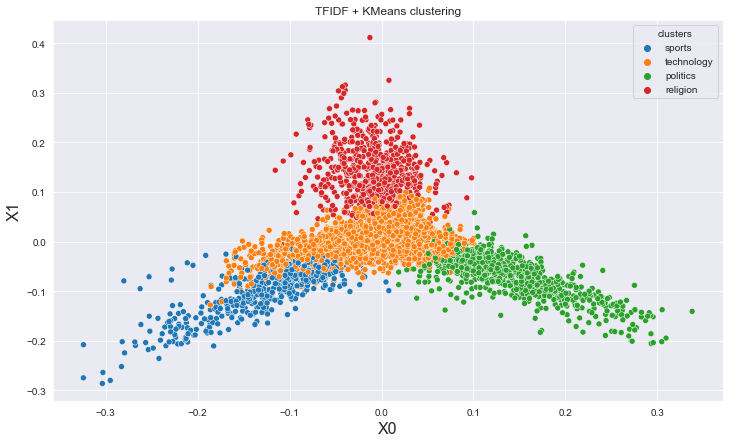

In [29]:
import seaborn as sns

plt.figure(figsize = (12, 7))
plt.title("TFIDF + KMeans clustering")
plt.xlabel("X0", fontdict = {'fontsize': 16})
plt.ylabel("X1", fontdict = {'fontsize': 16})
sns.scatterplot(data = news, x = 'x0', y = 'x1', hue = 'clusters', palette = 'tab10')
plt.show()

In [30]:
# transforming the words vocabulary into a dataframe
clusters = vectorizer.vocabulary_

data  = {'Words': list(clusters.keys()),
         'Count': list(clusters.values())}
df2 = pd.DataFrame(data)

In [31]:
# Visualizing groups

alt.Chart(news.sample(4000)).mark_circle(
    size = 100
).encode(
    x = 'x0',
    y = 'x1',
    color = 'clusters:N',
    tooltip = 'content'
).properties(
    width=900,
    height=500
).interactive()

alt.Chart(...)